In [1]:
#load package
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib
import os
import anndata
import seaborn as sns
import time
import warnings
import matplotlib.pyplot as plt
import matplotlib as mpl
import plotly.express as px
from matplotlib.backends.backend_pdf import PdfPages
from warnings import simplefilter
from anndata import AnnData
from matplotlib.pyplot import rc_context


In [2]:
##Basic Configuration
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()

# Plotting options, change to your liking
sc.settings.set_figure_params(dpi=300, frameon=False)
sc.set_figure_params(dpi=300)
sc.set_figure_params(figsize=(4, 4))

scanpy==1.10.2 anndata==0.10.8 umap==0.5.6 numpy==1.26.4 scipy==1.14.0 pandas==1.5.3 scikit-learn==1.5.1 statsmodels==0.14.2 igraph==0.11.5 louvain==0.8.2 pynndescent==0.5.13


In [5]:
coord_df = pd.read_csv('./umap.csv', index_col='index', sep=',')
coord_df.columns=['x','y']

metadata_df = pd.read_csv('./Metadata.csv', index_col='index', sep=',')

In [3]:
adata = anndata.read('./obj.h5ad')

/Users/lironghai/anaconda3/envs/For_sc/lib/python3.10/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [6]:
adata.obs = adata.obs.join(metadata_df)

In [7]:
adata.obsm['X_umap'] = coord_df[['x', 'y']].values

In [8]:
adata

AnnData object with n_obs × n_vars = 115723 × 17094
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'DoubletScore', 'DoubletEnrichment', 'Organs', 'Clusters', 'Celltypes', 'Major_celltypes', 'ReadsInPeaks', 'FRIP'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_umap'

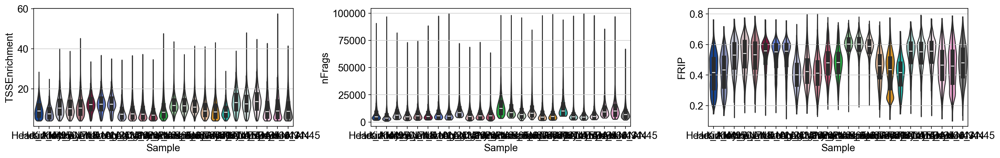

In [9]:
with rc_context({"figure.figsize": (6, 3)}):
    sc.pl.violin(
        adata,
        ["TSSEnrichment", "nFrags","FRIP"],
        groupby="Sample",
        stripplot=False,  # remove the internal dots
        inner="box", 
        save = ".pdf"# adds a boxplot inside violins
    )

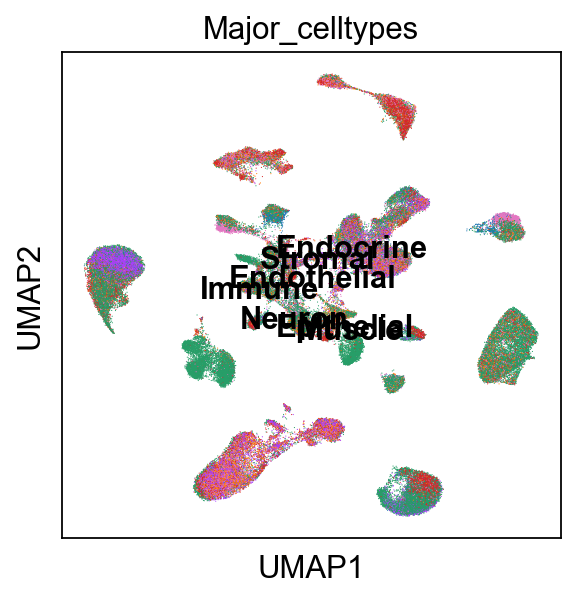

In [10]:
sc.pl.umap(
    adata, color="Major_celltypes", legend_loc="on data",save=".pdf"
)

In [21]:
# Find differentially expressed genes in cluster
sc.tl.rank_genes_groups(adata, 'Celltypes', method='wilcoxon')


/Users/lironghai/anaconda3/envs/For_sc/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/Users/lironghai/anaconda3/envs/For_sc/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/Users/lironghai/anaconda3/envs/For_sc/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:

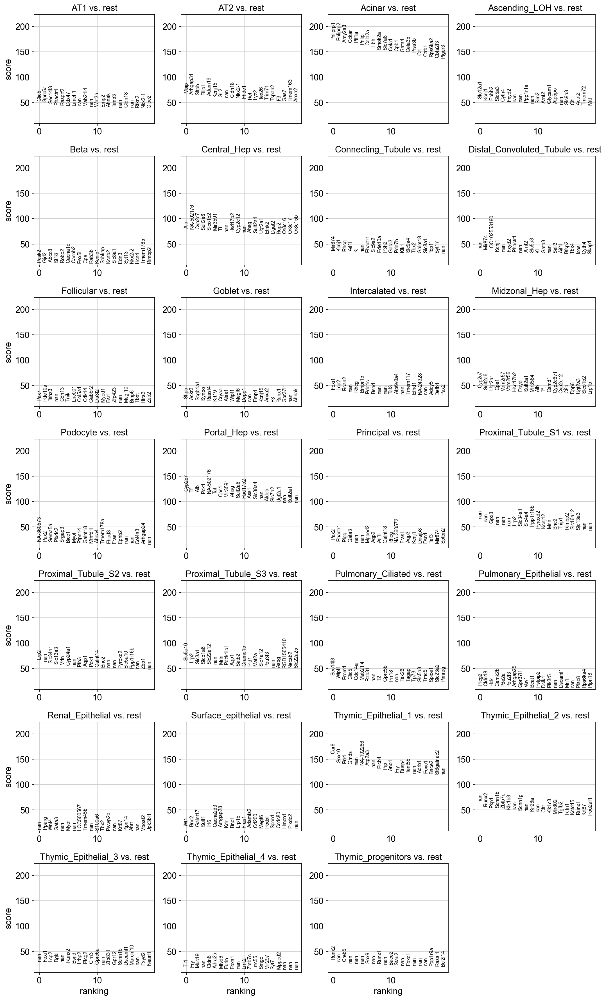

In [22]:
sc.tl.filter_rank_genes_groups(adata, min_fold_change=1)
# visualize results
sc.pl.rank_genes_groups(adata, key='rank_genes_groups_filtered')

/Users/lironghai/anaconda3/envs/For_sc/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 17094 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


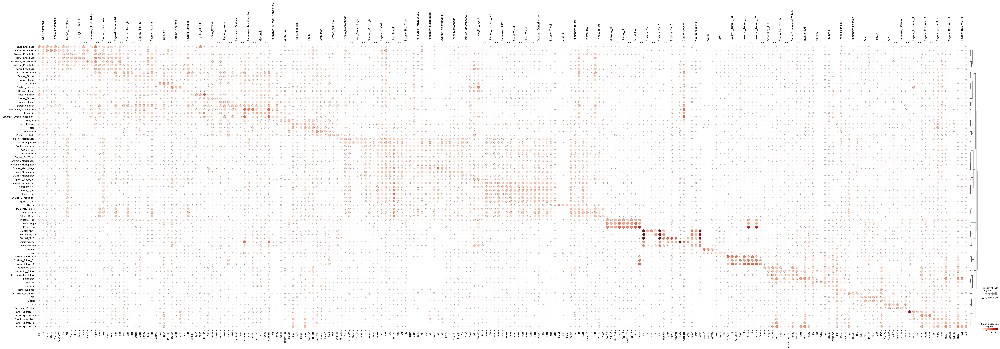

In [13]:
# visualize results using dotplot
sc.pl.rank_genes_groups_dotplot(adata, n_genes = 3, key='rank_genes_groups_filtered',save="top10_genes.pdf")

plot_dotplot_marker_gene_each_cluster:


/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


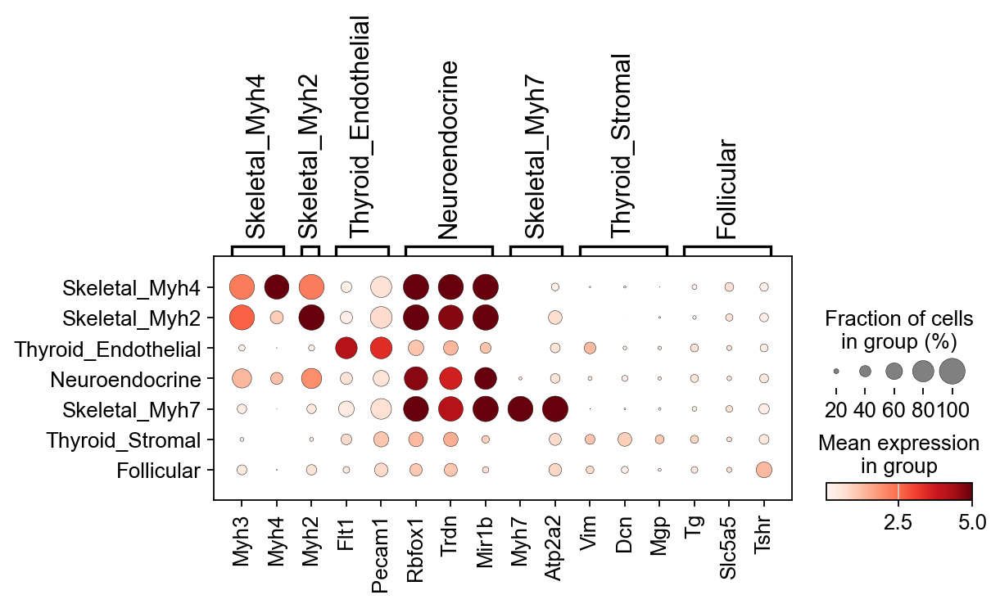

In [74]:
# Subset of organs of interest
selected_Organ = ['Thyroid']

# Screening the data for these cell types
adata_filtered = adata[adata.obs['Organs'].isin(selected_Organ)].copy()

marker_genes_dict = {
    'Skeletal_Myh4': ["Myh3", "Myh4"],
    'Skeletal_Myh2': ["Myh2"],
    'Thyroid_Endothelial': ["Flt1", "Pecam1"],
    'Neuroendocrine': ["Rbfox1","Trdn","Mir1b"],
    'Skeletal_Myh7': ["Myh7","Atp2a2"],
    'Thyroid_Stromal': ["Vim", "Dcn","Mgp"],
    'Follicular': ['Tg',"Slc5a5","Tshr"],
}

# Determining the order of cell types
celltype_order = list(marker_genes_dict.keys())

# Plotting
print("plot_dotplot_marker_gene_each_cluster:")
sc.pl.dotplot(adata_filtered,
              marker_genes_dict,
              groupby='Celltypes',
              dendrogram=False, 
              vmax = 5,
              dot_min = 0.1,
              categories_order=celltype_order,
              save="Thyroid_marker_genes_ordered.pdf")

plot_dotplot_marker_gene_each_cluster:


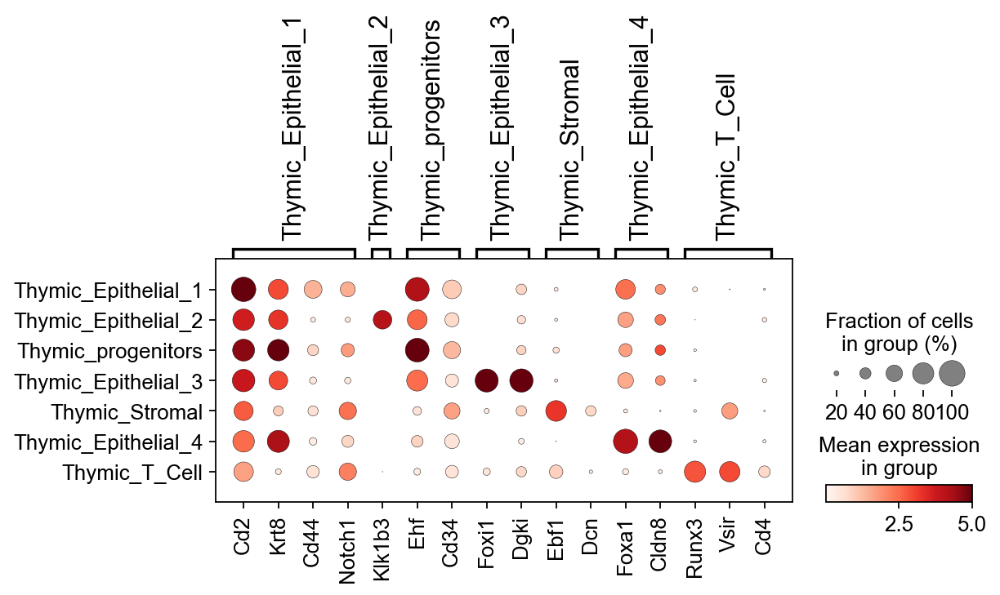

In [17]:
# Subset of organs of interest
selected_Organ = ['Thymus']

# Screening the data for these cell types
adata_filtered = adata[adata.obs['Organs'].isin(selected_Organ)].copy()

marker_genes_dict = {
    'Thymic_Epithelial_1': ["Cd2","Krt8","Cd44","Notch1"],
    'Thymic_Epithelial_2': ["Klk1b3"],
    'Thymic_progenitors': ["Ehf","Cd34"],
    'Thymic_Epithelial_3': ["Foxi1","Dgki"],
    'Thymic_Stromal': ["Ebf1","Dcn"],
    'Thymic_Epithelial_4': ["Foxa1","Cldn8",],
    'Thymic_T_Cell': ['Runx3',"Vsir","Cd4"],
}

# Determining the order of cell types
celltype_order = list(marker_genes_dict.keys())

# Plotting
print("plot_dotplot_marker_gene_each_cluster:")
sc.pl.dotplot(adata_filtered,
              marker_genes_dict,
              groupby='Celltypes',
              dendrogram=False, 
              vmax = 5,
              dot_min = 0.1,
              categories_order=celltype_order,
              save="Thymus_marker_genes_ordered.pdf")

plot_dotplot_marker_gene_each_cluster:


/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


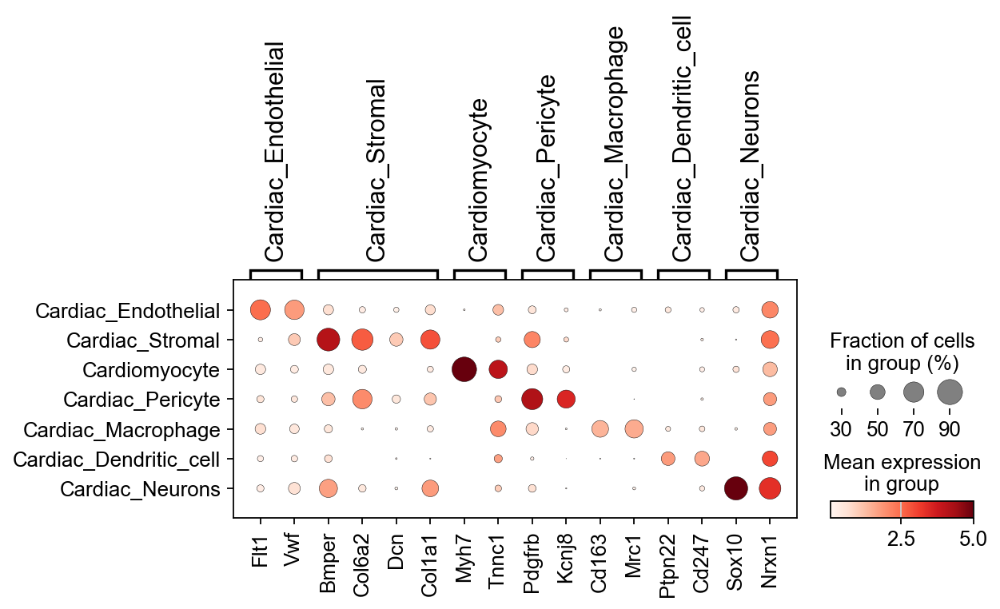

In [77]:
# Subset of organs of interest
selected_Organ = ['Heart']

# Screening the data for these cell types
adata_filtered = adata[adata.obs['Organs'].isin(selected_Organ)].copy()

marker_genes_dict = {
    'Cardiac_Endothelial': ["Flt1", "Vwf"],
    'Cardiac_Stromal': ["Bmper","Col6a2","Dcn","Col1a1"],
    'Cardiomyocyte': ["Myh7", "Tnnc1"],
    'Cardiac_Pericyte': ["Pdgfrb", "Kcnj8"],
    'Cardiac_Macrophage': ["Cd163", "Mrc1"],
    'Cardiac_Dendritic_cell': ["Ptpn22", "Cd247"],
    'Cardiac_Neurons': ["Sox10","Nrxn1"],
}

# Determining the order of cell types
celltype_order = list(marker_genes_dict.keys())

# Plotting
print("plot_dotplot_marker_gene_each_cluster:")
sc.pl.dotplot(adata_filtered,
              marker_genes_dict,
              groupby='Celltypes',
              dendrogram=False, 
              vmax = 5,
              dot_min = 0.1,
              categories_order=celltype_order,
              save="Heart_marker_genes_ordered.pdf")

plot_dotplot_marker_gene_each_cluster:


/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


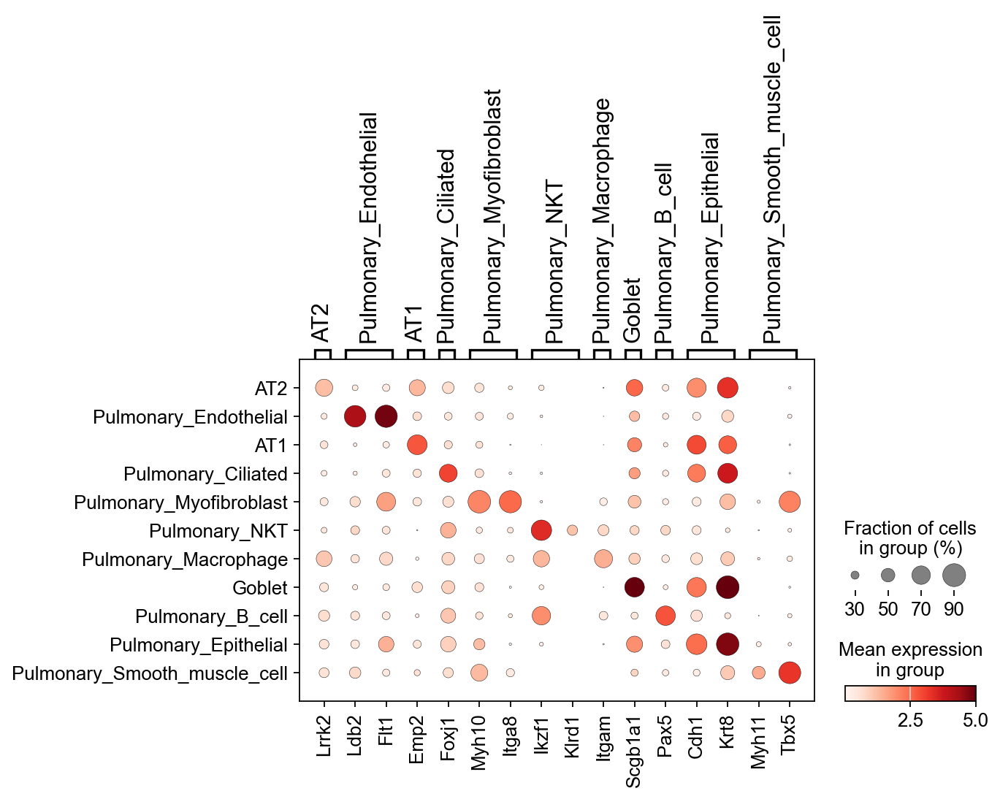

In [83]:
# Subset of organs of interest
selected_Organ = ['Lung']

# Screening the data for these cell types
adata_filtered = adata[adata.obs['Organs'].isin(selected_Organ)].copy()

marker_genes_dict = {
    'AT2': ["Lrrk2"],
    'Pulmonary_Endothelial': ["Ldb2","Flt1"],
    'AT1': ["Emp2"],
    'Pulmonary_Ciliated': [ "Foxj1"],
    'Pulmonary_Myofibroblast': ["Myh10", "Itga8"],
    'Pulmonary_NKT': ["Ikzf1",  "Klrd1"],
    'Pulmonary_Macrophage': ["Itgam"],
    'Goblet': ["Scgb1a1"],
    'Pulmonary_B_cell': ["Pax5"],
    'Pulmonary_Epithelial': ["Cdh1", "Krt8"],
    'Pulmonary_Smooth_muscle_cell': ["Myh11", "Tbx5"],
}

# Determining the order of cell types
celltype_order = list(marker_genes_dict.keys())

# Plotting
print("plot_dotplot_marker_gene_each_cluster:")
sc.pl.dotplot(adata_filtered,
              marker_genes_dict,
              groupby='Celltypes',
              dendrogram=False, 
              vmax = 5,
              dot_min = 0.1,
              categories_order=celltype_order,
              save="Lung_marker_genes_ordered.pdf")

plot_dotplot_marker_gene_each_cluster:


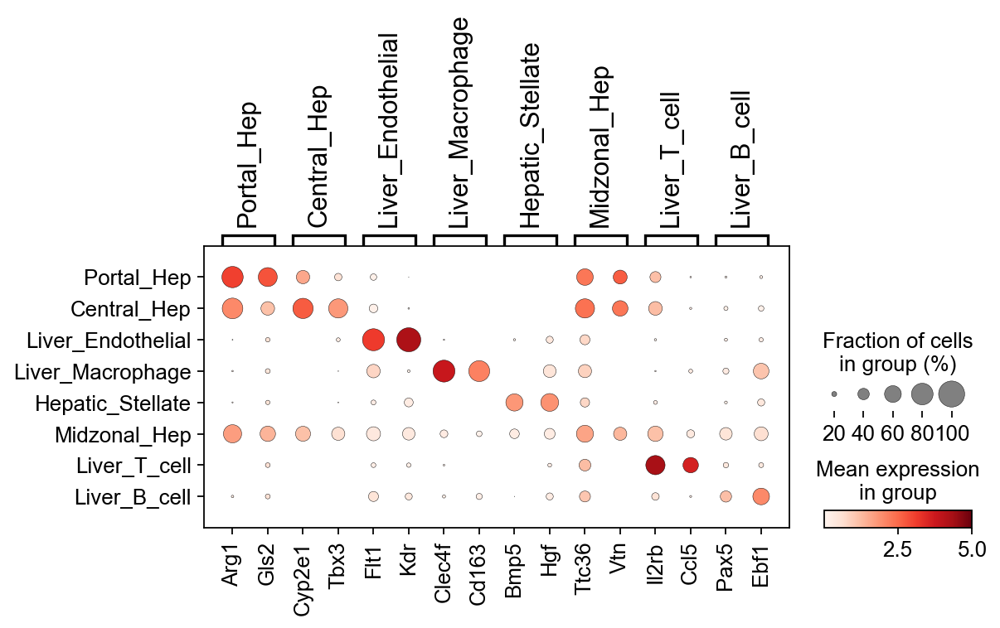

In [25]:
# Subset of organs of interest
selected_Organ = ['Liver']

# Screening the data for these cell types
adata_filtered = adata[adata.obs['Organs'].isin(selected_Organ)].copy()

marker_genes_dict = {
    'Portal_Hep': ["Arg1", "Gls2"],
    'Central_Hep': ["Cyp2e1","Tbx3"],
    'Liver_Endothelial': ["Flt1","Kdr"],
    'Liver_Macrophage': [ "Clec4f", "Cd163"],
    'Hepatic_Stellate': ["Bmp5", "Hgf"],
    'Midzonal_Hep': ["Ttc36", "Vtn"],
    'Liver_T_cell': ["Il2rb","Ccl5"],
    'Liver_B_cell': ["Pax5","Ebf1"],
}

# Determining the order of cell types
celltype_order = list(marker_genes_dict.keys())

# Plotting
print("plot_dotplot_marker_gene_each_cluster:")
sc.pl.dotplot(adata_filtered,
              marker_genes_dict,
              groupby='Celltypes',
              dendrogram=False, 
              vmax = 5,
              dot_min = 0.1,
              categories_order=celltype_order,
              save="Liver_marker_genes_ordered.pdf")

plot_dotplot_marker_gene_each_cluster:


/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


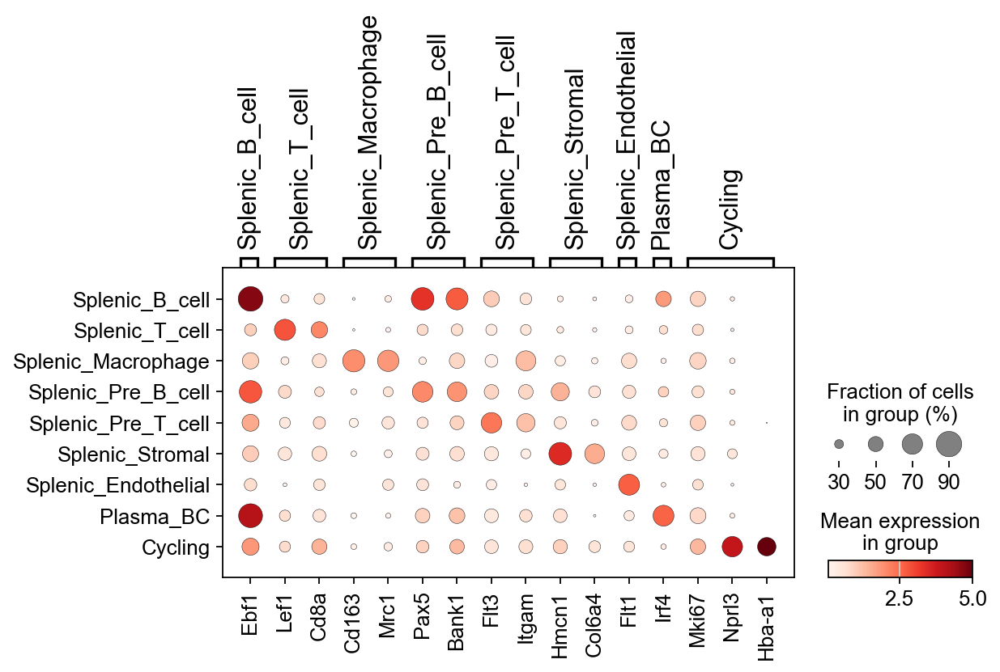

In [93]:
# Subset of organs of interest
selected_Organ = ['Spleen']

# Screening the data for these cell types
adata_filtered = adata[adata.obs['Organs'].isin(selected_Organ)].copy()

marker_genes_dict = {
    'Splenic_B_cell': ["Ebf1"],
    'Splenic_T_cell': ["Lef1", "Cd8a"],
    'Splenic_Macrophage': ["Cd163", "Mrc1"],
    'Splenic_Pre_B_cell': ["Pax5","Bank1" ],
    'Splenic_Pre_T_cell': ["Flt3", "Itgam"],
    'Splenic_Stromal': ["Hmcn1", "Col6a4"],
    'Splenic_Endothelial': ["Flt1"],
    'Plasma_BC': ["Irf4"],
    'Cycling': ["Mki67","Nprl3","Hba-a1"],
}

# Determining the order of cell types
celltype_order = list(marker_genes_dict.keys())

# Plotting
print("plot_dotplot_marker_gene_each_cluster:")
sc.pl.dotplot(adata_filtered,
              marker_genes_dict,
              groupby='Celltypes',
              dendrogram=False, 
              vmax = 5,
              dot_min = 0.1,
              categories_order=celltype_order,
              save="Spleen_marker_genes_ordered.pdf")

plot_dotplot_marker_gene_each_cluster:


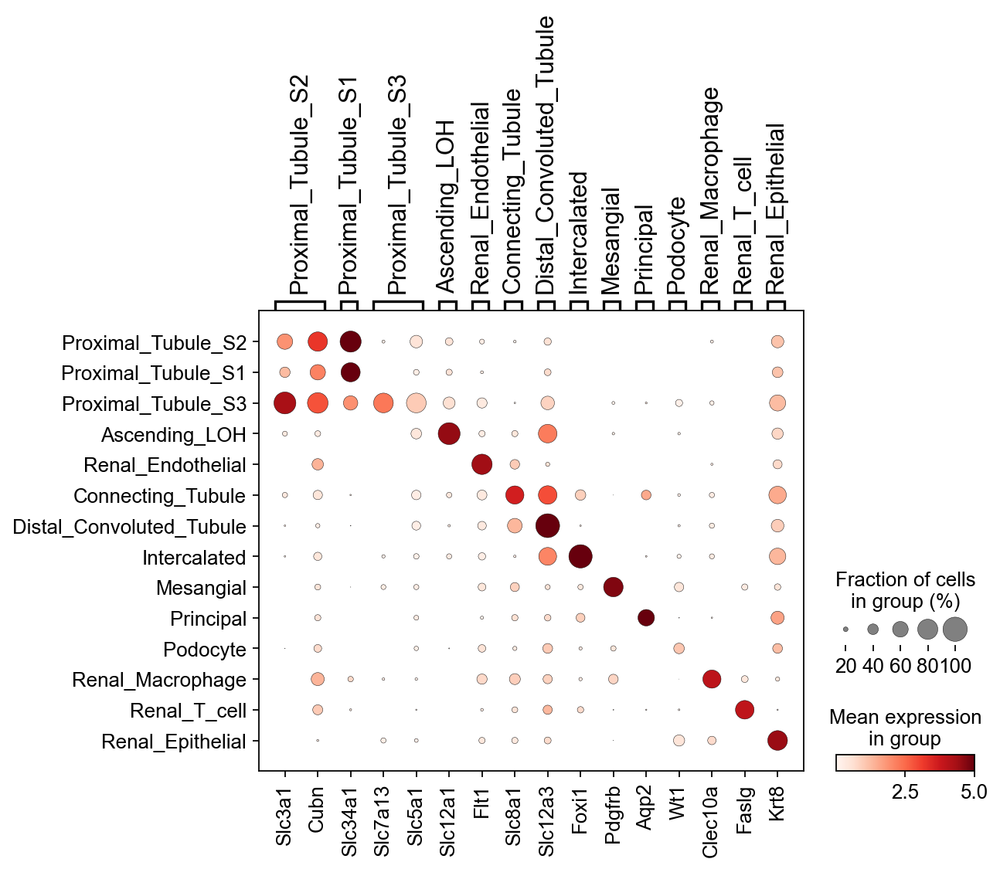

In [29]:
# Subset of organs of interest
selected_Organ = ['Kidney']

# Screening the data for these cell types
adata_filtered = adata[adata.obs['Organs'].isin(selected_Organ)].copy()

marker_genes_dict = {
    'Proximal_Tubule_S2': ["Slc3a1", "Cubn"],
    'Proximal_Tubule_S1': ["Slc34a1"],
    'Proximal_Tubule_S3': ["Slc7a13","Slc5a1"],
    'Ascending_LOH': ["Slc12a1"],
    'Renal_Endothelial': ["Flt1"],
    'Connecting_Tubule': ["Slc8a1"],
    'Distal_Convoluted_Tubule': ["Slc12a3"],
    'Intercalated': ["Foxi1"],
    'Mesangial': ["Pdgfrb"],
    'Principal': ["Aqp2"],
    'Podocyte': ["Wt1"],
    'Renal_Macrophage': ["Clec10a"],
    'Renal_T_cell': ["Faslg"],
    'Renal_Epithelial': [ "Krt8"],
}

# Determining the order of cell types
celltype_order = list(marker_genes_dict.keys())

# Plotting
print("plot_dotplot_marker_gene_each_cluster:")
sc.pl.dotplot(adata_filtered,
              marker_genes_dict,
              groupby='Celltypes',
              dendrogram=False, 
              vmax = 5,
              dot_min = 0.1,
              categories_order=celltype_order,
              save="Kidney_marker_genes_ordered.pdf")

plot_dotplot_marker_gene_each_cluster:


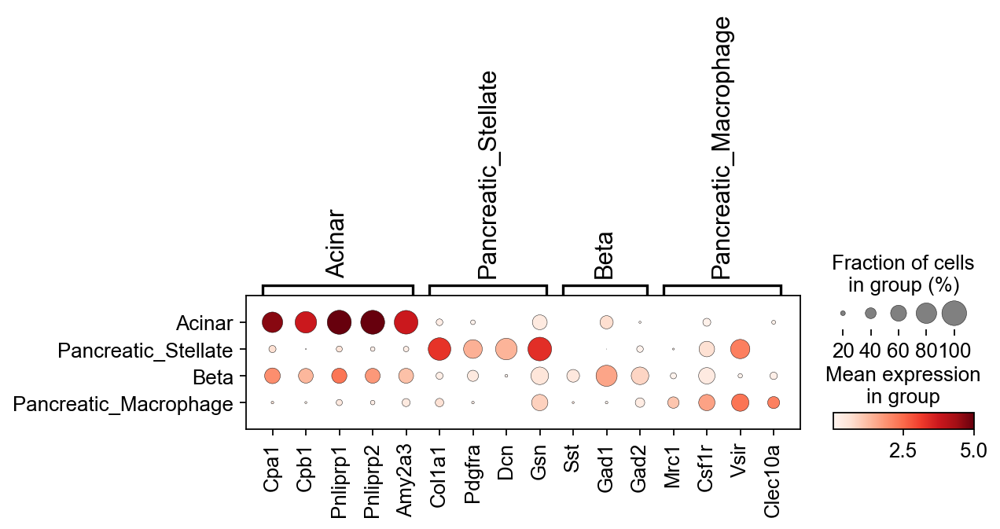

In [34]:
# Subset of organs of interest
selected_Organ = ['Pancreas']

# Screening the data for these cell types
adata_filtered = adata[adata.obs['Organs'].isin(selected_Organ)].copy()

marker_genes_dict = {
    'Acinar': ["Cpa1", "Cpb1", "Pnliprp1","Pnliprp2","Amy2a3"],
    'Pancreatic_Stellate': ["Col1a1", "Pdgfra", "Dcn", "Gsn"],
    'Beta': ["Sst", "Gad1","Gad2"],
    'Pancreatic_Macrophage': [ "Mrc1", "Csf1r", "Vsir","Clec10a"],
}

# Determining the order of cell types
celltype_order = list(marker_genes_dict.keys())

# Plotting
print("plot_dotplot_marker_gene_each_cluster:")
sc.pl.dotplot(adata_filtered,
              marker_genes_dict,
              groupby='Celltypes',
              dendrogram=False, 
              vmax = 5,
              dot_min = 0.1,
              categories_order=celltype_order,
              save="Pancreas_marker_genes_ordered.pdf")

plot_dotplot_marker_gene_each_cluster:


/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:169: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  obs_bool.groupby(level=0).sum() / obs_bool.groupby(level=0).count()
/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:179: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  dot_color_df = self.obs_tidy.groupby(level=0).mean()
/Users/lironghai/anaconda3/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


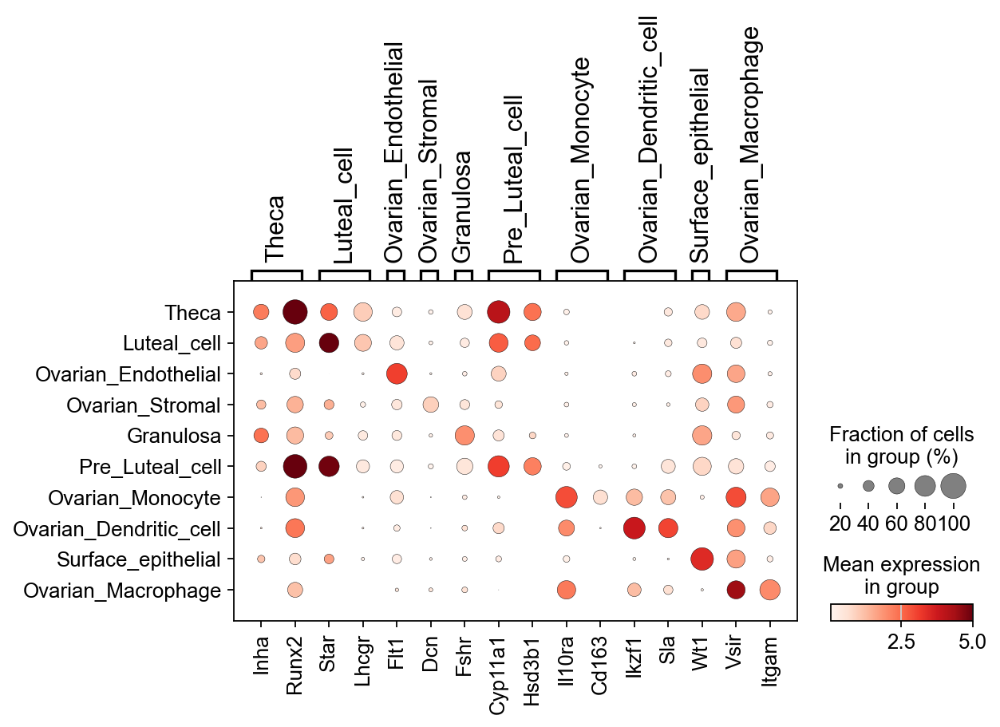

In [104]:
# Subset of organs of interest
selected_Organ = ['Ovary']

# Screening the data for these cell types
adata_filtered = adata[adata.obs['Organs'].isin(selected_Organ)].copy()

marker_genes_dict = {
    'Theca': ["Inha", "Runx2"],
    'Luteal_cell': ["Star","Lhcgr"],
    'Ovarian_Endothelial': ["Flt1"],
    'Ovarian_Stromal': ["Dcn"],
    'Granulosa': ["Fshr"],
    'Pre_Luteal_cell': ["Cyp11a1", "Hsd3b1"],
    'Ovarian_Monocyte': ["Il10ra", "Cd163"],
    'Ovarian_Dendritic_cell': ["Ikzf1","Sla"],
    'Surface_epithelial': ["Wt1"],
    'Ovarian_Macrophage': [ "Vsir","Itgam"],
}

# Determining the order of cell types
celltype_order = list(marker_genes_dict.keys())

# Plotting
print("plot_dotplot_marker_gene_each_cluster:")
sc.pl.dotplot(adata_filtered,
              marker_genes_dict,
              groupby='Celltypes',
              dendrogram=False, 
              vmax = 5,
              dot_min = 0.1,
              categories_order=celltype_order,
              save="Ovary_marker_genes_ordered.pdf")

In [28]:
# compute hierarchical clustering using PCs (several distance metrics and linkage methods are available).
sc.tl.dendrogram(adata, "Celltypes",linkage_method = "complete",optimal_ordering = True)


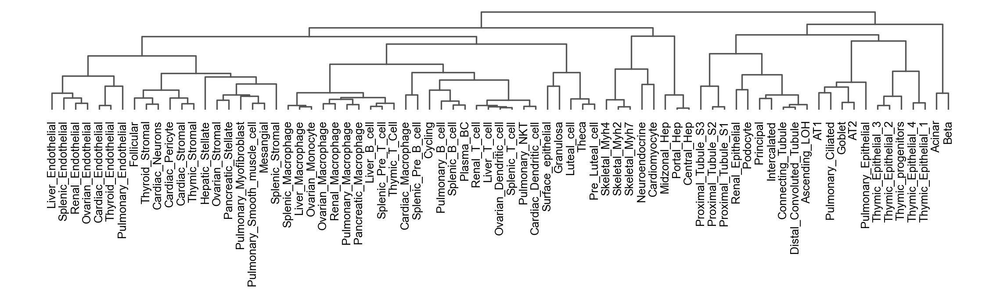

In [8]:
sc.set_figure_params(figsize=(18, 2))
ax = sc.pl.dendrogram(adata, "Celltypes",save=".pdf")

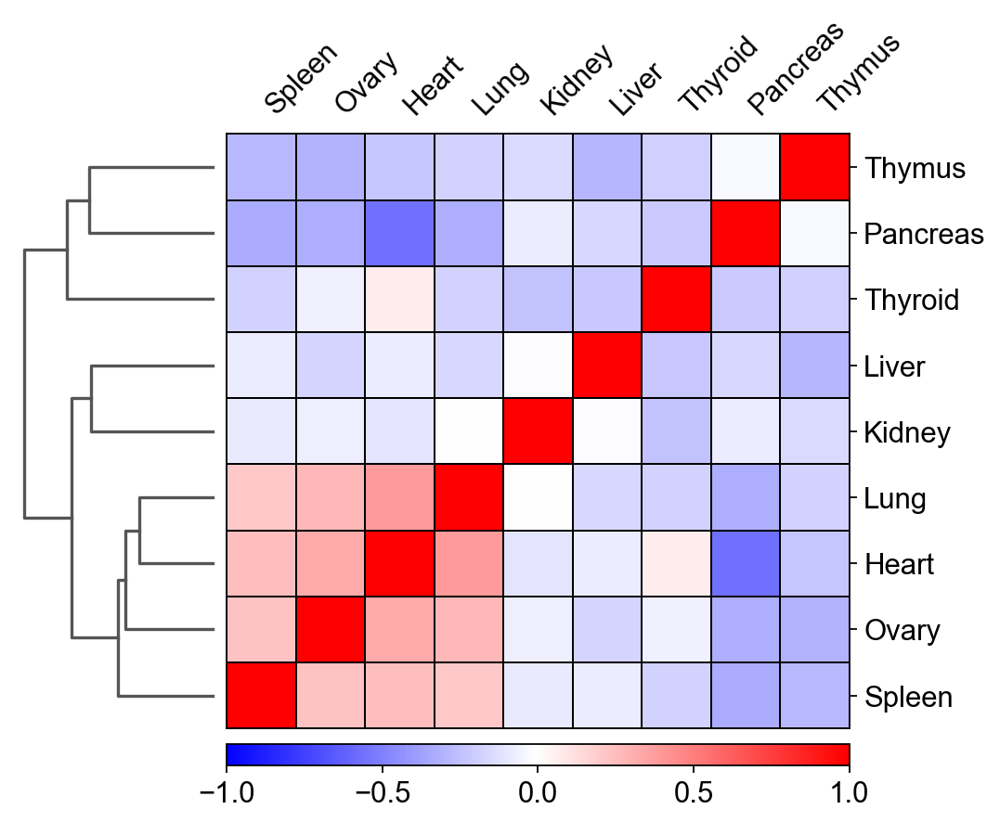

In [44]:
ax = sc.pl.correlation_matrix(adata, "Organs",save=".pdf")

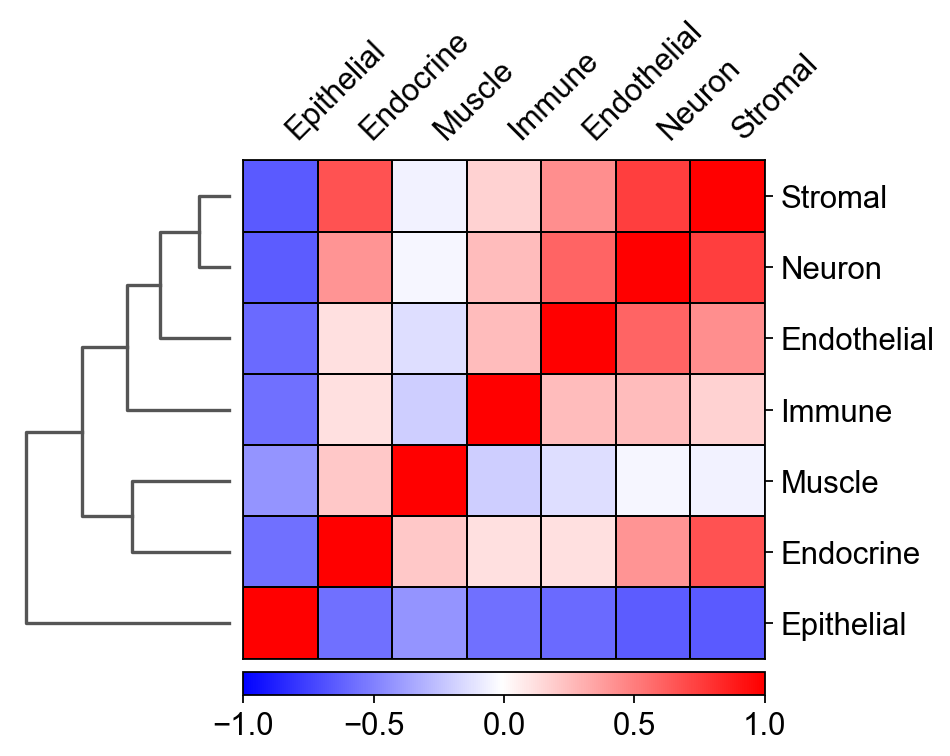

In [45]:
ax = sc.pl.correlation_matrix(adata, "Major_celltypes",save="Major_celltypes.pdf")

/Users/lironghai/anaconda3/envs/For_sc/lib/python3.10/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 17094 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


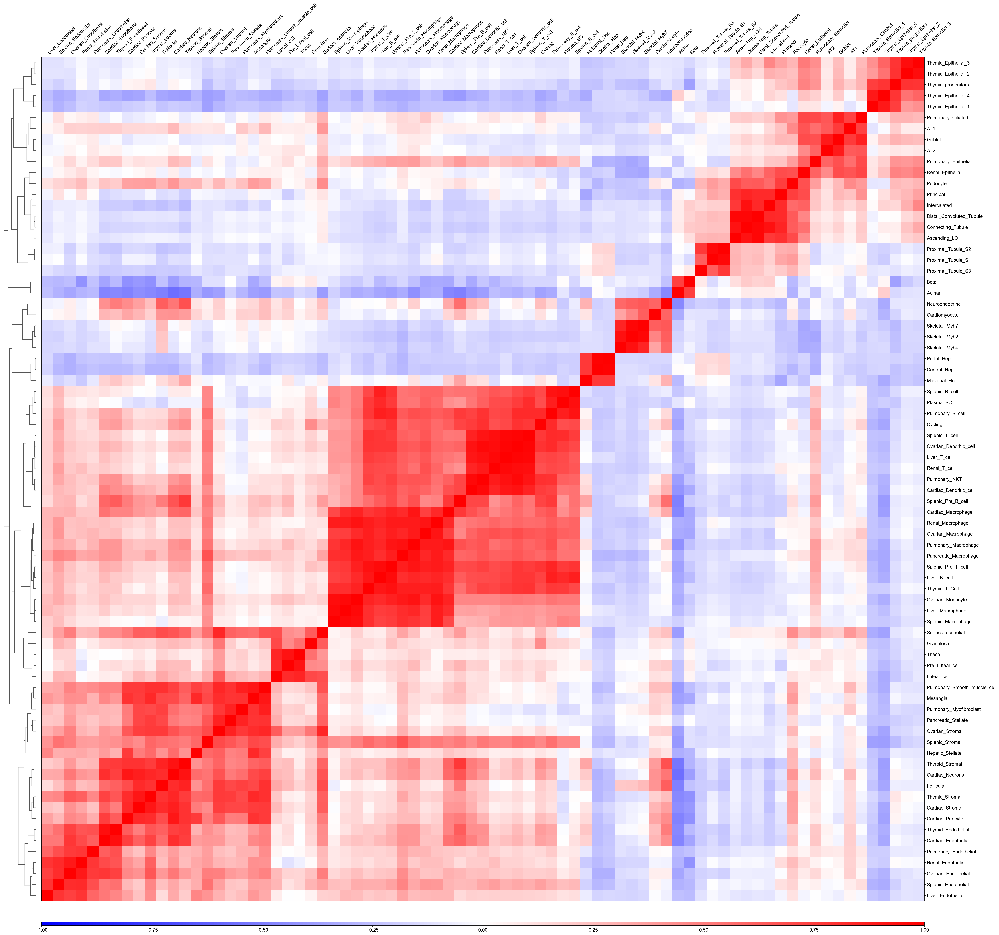

In [7]:
ax = sc.pl.correlation_matrix(adata, "Celltypes",save="Celltypes.pdf")

In [10]:
# scale and store results in layer
adata.layers["scaled"] = sc.pp.scale(adata, copy=True).X

In [12]:
adata_balanced = adata.copy()

# Get cell type lable
cell_types = adata_balanced.obs['Celltypes'].unique()

# Find the minimum number of cells for each cell type
min_count = min(adata_balanced.obs['Celltypes'].value_counts())

random_seed = 42
np.random.seed(random_seed)

# Sampling of each cell type
indices = []
for cell_type in cell_types:
    cell_type_indices = adata_balanced.obs[adata_balanced.obs['Celltypes'] == cell_type].index
    sampled_indices = np.random.choice(cell_type_indices, min_count, replace=False)
    indices.extend(sampled_indices)

adata_balanced = adata_balanced[indices]
adata_balanced


View of AnnData object with n_obs × n_vars = 6083 × 17094
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'Sample', 'TSSEnrichment', 'ReadsInTSS', 'ReadsInPromoter', 'PromoterRatio', 'PassQC', 'NucleosomeRatio', 'nMultiFrags', 'nMonoFrags', 'nFrags', 'nDiFrags', 'DoubletScore', 'DoubletEnrichment', 'Organs', 'Clusters', 'Celltypes', 'Major_celltypes', 'ReadsInPeaks', 'FRIP', 'x', 'y'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    uns: 'rank_genes_groups', 'rank_genes_groups_filtered', 'pca', 'dendrogram_Celltypes'
    obsm: 'X_pca'
    varm: 'PCs'
    layers: 'scaled'

In [43]:
# plotting
sc.pl.rank_genes_groups_heatmap(
    adata_balanced,
    n_genes=20,
    use_raw=False,
    swap_axes=True,
    vmin=-3,
    vmax=3,
    cmap="bwr",
    layer="scaled",
    figsize=(18, 7),
    show=False,
    save=".pdf"
)

{'heatmap_ax': <AxesSubplot: >,
 'groupby_ax': <AxesSubplot: xlabel='Celltypes'>,
 'dendrogram_ax': <AxesSubplot: >,
 'gene_groups_ax': <AxesSubplot: >}

In [ ]:
# Subset data of epithelial cells
selected_Major_Celltype = ['Epithelial']

# Screening the data for these cell types
adata_filtered = adata[adata.obs['Major_celltypes'].isin(selected_Major_Celltype)].copy()


In [32]:
# Find differentially expressed genes in cluster
sc.tl.rank_genes_groups(adata_filtered, 'Celltypes', method='wilcoxon')

sc.tl.filter_rank_genes_groups(adata_filtered, min_fold_change=1)

/Users/lironghai/anaconda3/envs/For_sc/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/Users/lironghai/anaconda3/envs/For_sc/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/Users/lironghai/anaconda3/envs/For_sc/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:

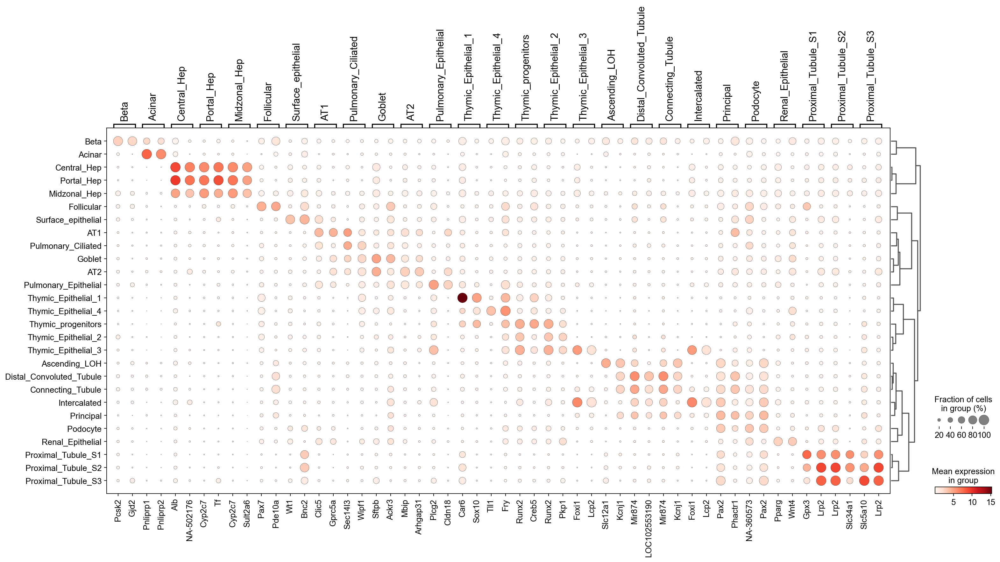

In [34]:
# visualize results using dotplot
sc.pl.rank_genes_groups_dotplot(adata_filtered, n_genes = 2, key='rank_genes_groups_filtered',save="top10_genes.pdf")